In [1]:
import numpy as ny
import pandas as pd
import seaborn as sns
import datetime as dt
import warnings
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import display
from plotly.offline import init_notebook_mode
from plotly.subplots import make_subplots 
from plotly.offline import init_notebook_mode, iplot
from scipy import stats
%matplotlib inline
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
init_notebook_mode(connected = True) 

In [3]:
df = pd.read_csv('TAB_Betting_Data.csv')

## Data Preparation

### Kiểm tra missing value

In [5]:
def features_with_missing_values(data):
    x = data.isnull().sum().sum()/(data.shape[0]*data.shape[1])*100
    print('Percentage of Total Missing Values is ' ,round(x,2) ,'%')
    print('Missing Value Estimation :')
    for i in data.columns:
        if data[i].isna().sum()>0:
            print('The Feature ',i,' has '+ str(data[i].isna().sum()) + ' missing values')

In [6]:
features_with_missing_values(df)

Percentage of Total Missing Values is  15.45 %
Missing Value Estimation :
The Feature  AGE  has 2676 missing values
The Feature  FOB_RACING_TURNOVER  has 3787445 missing values
The Feature  FOB_SPORT_TURNOVER  has 10584521 missing values
The Feature  PARI_RACING_TURNOVER  has 3836612 missing values
The Feature  PARI_SPORT_TURNOVER  has 12348423 missing values


### Kiểm tra Unique value

In [7]:
def count_unique_values_in_columns(dataframe):
    columns = dataframe.columns
    for column in columns:
        count_unique_values = dataframe[column].nunique()
        print(f"Number of unique values in column '{column}': {count_unique_values}")

In [8]:
count_unique_values_in_columns(df)

Number of unique values in column 'DATE_DIM': 730
Number of unique values in column 'DAY_OF_WEEK': 7
Number of unique values in column 'BET_ACCOUNT_NUM_HASH': 144869
Number of unique values in column 'AGE': 86
Number of unique values in column 'AGE_BAND': 7
Number of unique values in column 'GENDER': 3
Number of unique values in column 'TENURE_IN_DAYS': 20107
Number of unique values in column 'RESIDENTIAL_STATE': 2
Number of unique values in column 'FOB_RACING_TURNOVER': 22419
Number of unique values in column 'FOB_SPORT_TURNOVER': 47911
Number of unique values in column 'PARI_RACING_TURNOVER': 103543
Number of unique values in column 'PARI_SPORT_TURNOVER': 557
Number of unique values in column 'TOTAL_TURNOVER': 140076
Number of unique values in column 'DIVIDENDS_PAID': 252120
Number of unique values in column 'GROSS_MARGIN': 8320391
Number of unique values in column 'TICKETS': 2727


## Data Modelling

### Phân tích RFM

In [3]:
df['DATE_DIM'] = pd.to_datetime(df['DATE_DIM'])

In [13]:
# Calculate RFM metrics
snapshot_date = df['DATE_DIM'].max() + dt.timedelta(days=1)
rfm = df.groupby(['BET_ACCOUNT_NUM_HASH']).agg({'DATE_DIM': lambda x : (snapshot_date - x.max()).days,
                                      'BET_ACCOUNT_NUM_HASH':'count','TOTAL_TURNOVER': 'sum'})

rfm.rename(columns={'DATE_DIM':'Recency','BET_ACCOUNT_NUM_HASH':'Frequency','TOTAL_TURNOVER':'MonetaryValue'}
           ,inplace= True)

In [19]:
#Cách 1
r_labels =range(3,0,-1)
f_labels=range(1,4)
m_labels=range(1,4)
r_quartiles = pd.qcut(rfm['Recency'], q=3, labels = r_labels)
f_quartiles = pd.qcut(rfm['Frequency'], q=3, labels=f_labels)
m_quartiles = pd.qcut(rfm['MonetaryValue'],q=3,labels = m_labels)
rfm = rfm.assign(R=r_quartiles,F=f_quartiles,M=m_quartiles)

def add_rfm(x) : return str(x['R']) + str(x['F']) + str(x['M'])
rfm['RFM_Segment'] = rfm.apply(add_rfm,axis=1 )
rfm['RFM_Score'] = rfm[['R','F','M']].sum(axis=1)

In [20]:
rfm.head()

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM_Score
BET_ACCOUNT_NUM_HASH,,,,,,,,
13154,1,463,366186.08,3,3,3,333,9
18379,1,199,32033.00,3,3,3,333,9
37251,61,1,100.00,2,1,1,211,4
129273,13,16,155.00,3,2,1,321,6
348318,99,4,30.00,2,1,1,211,4


In [21]:
def Customer_Segment(data): 
    if data["R"]==1 and data["F"] in [1,2,3] and (data["M"]==3):
        return "Lost Customers - Big Spenders"
    elif data["R"]== 1 and data["F"] in [1,2] and data["M"] in [1,2]:
        return "Lost Customers - Bargain"
    elif data["R"] in [1,2] and data["F"]==3 and data["M"] in [1,2]:
        return "Lost/Almost Lost Customers - Loyal"
    elif (data["R"]==3) and (data["F"]==3) and data["M"] in [1,2]:
        return "Loyal Customers"
    elif (data["R"]==3) and data["F"] in [3,2] and data["M"]==3:
        return "Big Spenders"
    elif (data["R"]==3) and (data["F"]==1) and data["M"] in [1,2,3]:
        return "New Customers"
    elif (data["R"]==3) and (data["F"]==2) and data["M"] in [1,2]:
        return "Bargain Customers"
    elif (data["R"]==2) and data["F"]==2 and data["M"] in [1,2]:
        return "Occasional Customers-Bargain"
    elif (data["R"]==2) and data["F"] in [2,3] and data["M"]==3:
        return "Occasional Customers- Big Spenders"
    elif (data["R"]==2) and data["F"]==1 and data ["M"] in [1,2,3]:
        return "Unsatisfied Customers"
    else:
        return "No Segment"

In [22]:
rfm["R"]=rfm["R"].astype("category")
rfm["F"]=rfm["F"].astype("category")
rfm["M"]=rfm["M"].astype("category")
rfm["RFM_Segment"]=rfm.apply(Customer_Segment,axis=1)

In [32]:
#Cách 2
r_labels =range(5,0,-1)
f_labels=range(1,6)
m_labels=range(1,6)
r_quartiles = pd.qcut(rfm['Recency'], q=5, labels = r_labels)
f_quartiles = pd.qcut(rfm['Frequency'], q=5, labels=f_labels)
m_quartiles = pd.qcut(rfm['MonetaryValue'],q=5,labels = m_labels)
rfm = rfm.assign(R=r_quartiles,F=f_quartiles,M=m_quartiles)

def add_rfm(x) : return str(x['R']) + str(x['F']) + str(x['M'])
rfm['RFM_Segment'] = rfm.apply(add_rfm,axis=1 )
rfm['RFM_Score'] = rfm[['R','F','M']].sum(axis=1)

In [33]:
def Customer_Segment(data): 
    if data["RFM_Segment"] in ["555","554","544","545","455","445"]:
        return "Champions"
    elif data["RFM_Segment"] in ["543","444","435","355","354","345","344","335"]:
        return "Loyal Customers"
    elif data["RFM_Segment"] in ["553", "551", "552", "541", "542", "533", "532", "531", "452", "451", "442", "441", "431", "453", "433", "432", "423", "353", "352", "351", "342", "341", "333", "323"]:
        return "Potential Loyalist"
    elif data["RFM_Segment"] in ["512", "511", "422", "421", "412", "411", "311"]:
        return "Recent Customers"
    elif data["RFM_Segment"] in ["525", "524", "523", "522", "521", "515", "514", "513", "425", "424", "413", "414", "415", "315", "314", "313"]:
        return "Promising"
    elif data["RFM_Segment"] in ["535", "534", "443", "434", "343", "334", "325", "324"]:
        return "Customers Needing Attention"
    elif data["RFM_Segment"] in ["331", "321", "312", "221", "213"]:
        return "About To Sleep"
    elif data["RFM_Segment"] in ["255", "254", "245", "244", "253", "252", "243", "242", "235", "234", "225", "224", "153", "152", "145", "143", "142", "135", "134", "133", "125", "124"]:
        return "At risk"
    elif data["RFM_Segment"] in ["155", "154", "144", "214", "215", "115", "114", "113"]:
        return "Can't Lose Them"
    elif data["RFM_Segment"] in ["332", "322", "231", "241", "251", "233", "232", "223", "222", "132", "123", "122", "212", "211"]:
        return "Hibernating"
    else:
        return "Lost"

In [34]:
rfm["R"]=rfm["R"].astype("category")
rfm["F"]=rfm["F"].astype("category")
rfm["M"]=rfm["M"].astype("category")
rfm["RFM_Segment"]=rfm.apply(Customer_Segment,axis=1)

In [35]:
rfm.head()

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM_Score
BET_ACCOUNT_NUM_HASH,,,,,,,,
13154,1,463,366186.08,5,5,5,Champions,15
18379,1,199,32033.00,5,5,5,Champions,15
37251,61,1,100.00,3,1,1,Recent Customers,5
129273,13,16,155.00,4,3,2,Potential Loyalist,9
348318,99,4,30.00,2,2,1,About To Sleep,5


In [36]:
rfm.to_excel("RFM.xlsx", index=True)

#### RFM 2021

In [17]:
df_2021 = df[df['DATE_DIM'].dt.year == 2021]

In [18]:
# Calculate RFM metrics
snapshot_date = df_2021['DATE_DIM'].max() + dt.timedelta(days=1)
rfm = df_2021.groupby(['BET_ACCOUNT_NUM_HASH']).agg({'DATE_DIM': lambda x : (snapshot_date - x.max()).days,
                                      'BET_ACCOUNT_NUM_HASH':'count','TOTAL_TURNOVER': 'sum'})

rfm.rename(columns={'DATE_DIM':'Recency','BET_ACCOUNT_NUM_HASH':'Frequency','TOTAL_TURNOVER':'MonetaryValue'}
           ,inplace= True)

In [23]:
r_labels = range(5, 0, -1)  # Đảo ngược thứ tự nhãn
f_labels = range(1, 6)
m_labels = range(1, 6)
r_quartiles = pd.qcut(rfm['Recency'], q=5, labels=r_labels, duplicates='drop')
f_quartiles = pd.qcut(rfm['Frequency'], q=5, labels=f_labels, duplicates='drop')
m_quartiles = pd.qcut(rfm['MonetaryValue'], q=5, labels=m_labels, duplicates='drop')
rfm = rfm.assign(R=r_quartiles, F=f_quartiles, M=m_quartiles)

def add_rfm(x): 
    return str(x['R']) + str(x['F']) + str(x['M'])

rfm['RFM_Segment'] = rfm.apply(add_rfm, axis=1)
rfm['RFM_Score'] = rfm[['R', 'F', 'M']].sum(axis=1)

In [25]:
def Customer_Segment(data): 
    if data["RFM_Segment"] in ["555","554","544","545","455","445"]:
        return "Champions"
    elif data["RFM_Segment"] in ["543","444","435","355","354","345","344","335"]:
        return "Loyal Customers"
    elif data["RFM_Segment"] in ["553", "551", "552", "541", "542", "533", "532", "531", "452", "451", "442", "441", "431", "453", "433", "432", "423", "353", "352", "351", "342", "341", "333", "323"]:
        return "Potential Loyalist"
    elif data["RFM_Segment"] in ["512", "511", "422", "421", "412", "411", "311"]:
        return "Recent Customers"
    elif data["RFM_Segment"] in ["525", "524", "523", "522", "521", "515", "514", "513", "425", "424", "413", "414", "415", "315", "314", "313"]:
        return "Promising"
    elif data["RFM_Segment"] in ["535", "534", "443", "434", "343", "334", "325", "324"]:
        return "Customers Needing Attention"
    elif data["RFM_Segment"] in ["331", "321", "312", "221", "213"]:
        return "About To Sleep"
    elif data["RFM_Segment"] in ["255", "254", "245", "244", "253", "252", "243", "242", "235", "234", "225", "224", "153", "152", "145", "143", "142", "135", "134", "133", "125", "124"]:
        return "At risk"
    elif data["RFM_Segment"] in ["155", "154", "144", "214", "215", "115", "114", "113"]:
        return "Can't Lose Them"
    elif data["RFM_Segment"] in ["332", "322", "231", "241", "251", "233", "232", "223", "222", "132", "123", "122", "212", "211"]:
        return "Hibernating"
    else:
        return "Lost"

In [26]:
rfm["R"]=rfm["R"].astype("category")
rfm["F"]=rfm["F"].astype("category")
rfm["M"]=rfm["M"].astype("category")
rfm["RFM_Segment"]=rfm.apply(Customer_Segment,axis=1)

In [27]:
rfm.head()

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM_Score
BET_ACCOUNT_NUM_HASH,,,,,,,,
13154,3,263,269893.33,4,5,5,Champions,14
18379,4,77,13293.00,4,4,5,Champions,13
129273,6,1,20.00,4,1,1,Recent Customers,6
368326,60,2,43.00,3,1,1,Recent Customers,5
385032,46,13,66.00,3,3,1,About To Sleep,7


In [28]:
rfm.to_excel("RFM_2021.xlsx", index=True)

#### RFM 2022

In [59]:
df_2022 = df[df['DATE_DIM'].dt.year == 2022]

In [60]:
# Calculate RFM metrics
snapshot_date = df_2022['DATE_DIM'].max() + dt.timedelta(days=1)
rfm = df_2022.groupby(['BET_ACCOUNT_NUM_HASH']).agg({'DATE_DIM': lambda x : (snapshot_date - x.max()).days,
                                      'BET_ACCOUNT_NUM_HASH':'count','TOTAL_TURNOVER': 'sum'})

rfm.rename(columns={'DATE_DIM':'Recency','BET_ACCOUNT_NUM_HASH':'Frequency','TOTAL_TURNOVER':'MonetaryValue'}
           ,inplace= True)

In [65]:
r_labels = range(5, 0, -1)  # Đảo ngược thứ tự nhãn
f_labels = range(1, 6)
m_labels = range(1, 6)
# Sử dụng hàm pd.cut() với số lượng nhãn ít hơn 1 so với số lượng ranh giới
r_quartiles = pd.cut(rfm['Recency'],  bins=[0,73,146,219,292,366] , labels=r_labels, duplicates='drop')
f_quartiles = pd.qcut(rfm['Frequency'], q=5, labels=f_labels, duplicates='drop')
m_quartiles = pd.qcut(rfm['MonetaryValue'], q=5, labels=m_labels, duplicates='drop')
rfm = rfm.assign(R=r_quartiles, F=f_quartiles, M=m_quartiles)

def add_rfm(x): 
    return str(x['R']) + str(x['F']) + str(x['M'])

rfm['RFM_Segment'] = rfm.apply(add_rfm, axis=1)
rfm['RFM_Score'] = rfm[['R', 'F', 'M']].sum(axis=1)

In [67]:
def Customer_Segment(data): 
    if data["RFM_Segment"] in ["555","554","544","545","455","445"]:
        return "Champions"
    elif data["RFM_Segment"] in ["543","444","435","355","354","345","344","335"]:
        return "Loyal Customers"
    elif data["RFM_Segment"] in ["553", "551", "552", "541", "542", "533", "532", "531", "452", "451", "442", "441", "431", "453", "433", "432", "423", "353", "352", "351", "342", "341", "333", "323"]:
        return "Potential Loyalist"
    elif data["RFM_Segment"] in ["512", "511", "422", "421", "412", "411", "311"]:
        return "Recent Customers"
    elif data["RFM_Segment"] in ["525", "524", "523", "522", "521", "515", "514", "513", "425", "424", "413", "414", "415", "315", "314", "313"]:
        return "Promising"
    elif data["RFM_Segment"] in ["535", "534", "443", "434", "343", "334", "325", "324"]:
        return "Customers Needing Attention"
    elif data["RFM_Segment"] in ["331", "321", "312", "221", "213"]:
        return "About To Sleep"
    elif data["RFM_Segment"] in ["255", "254", "245", "244", "253", "252", "243", "242", "235", "234", "225", "224", "153", "152", "145", "143", "142", "135", "134", "133", "125", "124"]:
        return "At risk"
    elif data["RFM_Segment"] in ["155", "154", "144", "214", "215", "115", "114", "113"]:
        return "Can't Lose Them"
    elif data["RFM_Segment"] in ["332", "322", "231", "241", "251", "233", "232", "223", "222", "132", "123", "122", "212", "211"]:
        return "Hibernating"
    else:
        return "Lost"

In [68]:
rfm["R"]=rfm["R"].astype("category")
rfm["F"]=rfm["F"].astype("category")
rfm["M"]=rfm["M"].astype("category")
rfm["RFM_Segment"]=rfm.apply(Customer_Segment,axis=1)

In [69]:
rfm.head()

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM_Score
BET_ACCOUNT_NUM_HASH,,,,,,,,
13154,1,200,96292.75,5,5,5,Champions,15
18379,1,122,18740.00,5,5,5,Champions,15
37251,61,1,100.00,5,1,2,Recent Customers,8
129273,13,15,135.00,5,3,2,Potential Loyalist,10
348318,99,4,30.00,4,2,1,Recent Customers,7


In [71]:
rfm.describe()

,Recency,Frequency,MonetaryValue,RFM_Score
count,116488.000000,116488.000000,1.164880e+05,116488.000000
mean,59.155132,53.459455,9.365630e+03,10.502258
std,83.670943,78.871810,3.678822e+04,3.196858
min,1.000000,1.000000,0.000000e+00,3.000000
25%,2.000000,3.000000,1.365000e+02,8.000000
50%,26.000000,16.000000,7.670000e+02,11.000000
75%,61.000000,69.000000,4.928097e+03,13.000000
max,365.000000,365.000000,3.141618e+06,15.000000


In [70]:
rfm.to_excel("RFM_2022.xlsx", index=True)

### Phân khúc Kmeans

In [1]:
# import libraries
from datetime import datetime, timedelta
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from __future__ import division
from sklearn.cluster import KMeans

import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

import xgboost as xgb
from sklearn.model_selection import KFold, cross_val_score, train_test_split

import xgboost as xgb
#inititate Plotly
pyoff.init_notebook_mode()

In [2]:
#load our data from CSV
tx_data = pd.read_csv('TAB_Betting_Data.csv')

In [3]:
#convert the string date field to datetime
tx_data['DATE_DIM'] = pd.to_datetime(tx_data['DATE_DIM'])

#we will be using only 2022 data
tx_uk = tx_data[tx_data['DATE_DIM'].dt.year == 2022].reset_index(drop=True)

In [21]:
#create a generic user dataframe to keep CustomerID and new segmentation scores
tx_user = pd.DataFrame(tx_data['BET_ACCOUNT_NUM_HASH'].unique())
tx_user.columns = ['BET_ACCOUNT_NUM_HASH']

#get the max purchase date for each customer and create a dataframe with it
tx_max_purchase = tx_uk.groupby('BET_ACCOUNT_NUM_HASH').DATE_DIM.max().reset_index()
tx_max_purchase.columns = ['BET_ACCOUNT_NUM_HASH','MaxPurchaseDate']

#we take our observation point as the max invoice date in our dataset
tx_max_purchase['Recency'] = (tx_max_purchase['MaxPurchaseDate'].max() - tx_max_purchase['MaxPurchaseDate']).dt.days

#merge this dataframe to our new user dataframe
tx_user = pd.merge(tx_user, tx_max_purchase[['BET_ACCOUNT_NUM_HASH','Recency']], on='BET_ACCOUNT_NUM_HASH')

tx_user.head()

#plot a recency histogram

plot_data = [
    go.Histogram(
        x=tx_user['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [22]:
tx_user.Recency.describe()

count    110526.000000
mean         66.982936
std          89.336205
min           0.000000
25%           3.000000
50%          36.000000
75%          75.000000
max         364.000000
Name: Recency, dtype: float64

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: F

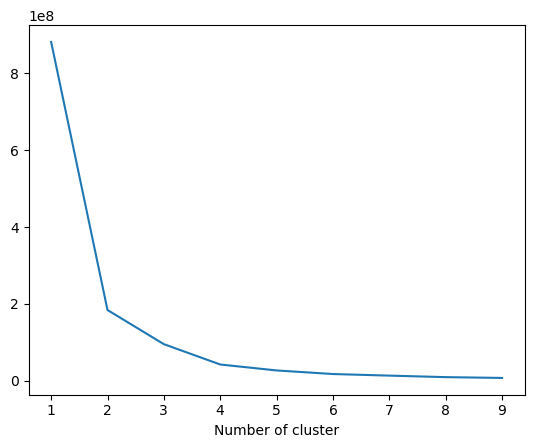

In [23]:
from sklearn.cluster import KMeans

sse={}
tx_recency = tx_user[['Recency']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_recency)
    tx_recency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [24]:
#build 3 clusters for recency and add it to dataframe
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_user[['Recency']])
tx_user['RecencyCluster'] = kmeans.predict(tx_user[['Recency']])

#function for ordering cluster numbers
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

tx_user = order_cluster('RecencyCluster', 'Recency',tx_user,False)

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [25]:
tx_user.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,15321.0,263.114549,57.426852,170.0,212.0,263.0,313.0,364.0
1,36577.0,76.990951,31.313369,44.0,59.0,59.0,95.0,169.0
2,58628.0,9.484888,12.291303,0.0,0.0,3.0,15.0,43.0


In [26]:
#get order counts for each user and create a dataframe with it
tx_frequency = tx_uk.groupby('BET_ACCOUNT_NUM_HASH').DATE_DIM.count().reset_index()
tx_frequency.columns = ['BET_ACCOUNT_NUM_HASH','Frequency']

#add this data to our main dataframe
tx_user = pd.merge(tx_user, tx_frequency, on='BET_ACCOUNT_NUM_HASH')

#plot the histogram
plot_data = [
    go.Histogram(
        x=tx_user.query('Frequency < 1000')['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [27]:
#k-means
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_user[['Frequency']])
tx_user['FrequencyCluster'] = kmeans.predict(tx_user[['Frequency']])

#order the frequency cluster
tx_user = order_cluster('FrequencyCluster', 'Frequency',tx_user,True)

#see details of each cluster
tx_user.groupby('FrequencyCluster')['Frequency'].describe()

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,80437.0,15.044121,17.090554,1.0,2.0,7.0,23.0,65.0
1,20112.0,115.386486,34.898299,66.0,85.0,109.0,143.0,188.0
2,9977.0,261.196652,50.824117,189.0,217.0,252.0,301.0,365.0


In [28]:
#calculate revenue for each customer
tx_uk['Revenue'] = tx_uk['TOTAL_TURNOVER']
tx_revenue = tx_uk.groupby('BET_ACCOUNT_NUM_HASH').Revenue.sum().reset_index()

#merge it with our main dataframe
tx_user = pd.merge(tx_user, tx_revenue, on='BET_ACCOUNT_NUM_HASH')

#plot the histogram
plot_data = [
    go.Histogram(
        x=tx_user.query('Revenue < 10000')['Revenue']
    )
]

plot_layout = go.Layout(
        title='Monetary Value'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [29]:
#apply clustering
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_user[['Revenue']])
tx_user['RevenueCluster'] = kmeans.predict(tx_user[['Revenue']])


#order the cluster numbers
tx_user = order_cluster('RevenueCluster', 'Revenue',tx_user,True)

#show details of the dataframe
tx_user.groupby('RevenueCluster')['Revenue'].describe()

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,108424.0,6.314044e+03,13840.080949,0.00,1.250000e+02,752.000,4.964408e+03,98431.69
1,2094.0,1.910042e+05,121418.343504,98550.88,1.183747e+05,150635.025,2.157393e+05,1231559.48
2,8.0,2.417754e+06,655534.057629,1674294.00,1.842852e+06,2415595.795,2.775082e+06,3461953.00


In [30]:
#calculate overall score and use mean() to see details
tx_user['OverallScore'] = tx_user['RecencyCluster'] + tx_user['FrequencyCluster'] + tx_user['RevenueCluster']
tx_user.groupby('OverallScore')['Recency','Frequency','Revenue'].mean()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_992\656864707.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,Recency,Frequency,Revenue
OverallScore,,,
0,264.028137,7.509935,1.648086e+03
1,77.876080,9.633737,1.456504e+03
2,18.257806,28.917856,3.896747e+03
3,5.671267,116.648265,1.535452e+04
4,1.265239,251.687896,3.816914e+04
5,1.013158,275.530960,2.033144e+05
6,1.666667,294.833333,2.498461e+06


In [31]:
tx_user.to_excel("KMeans_2021.xlsx", index=True)

In [18]:
tx_user['Segment'] = 'Low-Value'
tx_user.loc[tx_user['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_user.loc[tx_user['OverallScore']>4,'Segment'] = 'High-Value' 

In [19]:
tx_user

,BET_ACCOUNT_NUM_HASH,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment
0,13154,0,2,200,2,96292.75,1,5,High-Value
1,698904,0,2,352,2,81150.32,1,5,High-Value
2,5048855,0,2,191,2,88032.00,1,5,High-Value
3,6790445,1,2,265,2,197300.38,1,5,High-Value
4,13985923,0,2,287,2,162332.50,1,5,High-Value
...,...,...,...,...,...,...,...,...,...
116483,3798746194,128,1,162,1,441701.51,2,4,Mid-Value
116484,3277456887,50,1,105,1,817285.66,2,4,Mid-Value
116485,621170504,198,0,150,1,522729.07,2,3,Mid-Value
116486,3238945551,5,2,44,0,613697.03,2,4,Mid-Value


### Dự đoán CLV

In [10]:
#import libraries
from datetime import datetime, timedelta,date
import pandas as pd
%matplotlib inline
from sklearn.metrics import classification_report,confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from __future__ import division
from sklearn.cluster import KMeans


import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

import xgboost as xgb
from sklearn.model_selection import KFold, cross_val_score, train_test_split

import xgboost as xgb

#initate plotly
pyoff.init_notebook_mode()

In [11]:
tx_data = pd.read_csv('TAB_Betting_Data.csv')

In [28]:
#convert the string date field to datetime
tx_data['DATE_DIM'] = pd.to_datetime(tx_data['DATE_DIM'])

#we will be using only 2022 data
tx_3m = tx_data[tx_data['DATE_DIM'].dt.year == 2021].reset_index(drop=True)
tx_6m = tx_data[tx_data['DATE_DIM'].dt.year == 2022].reset_index(drop=True)

In [29]:
tx_user = pd.DataFrame(tx_3m['BET_ACCOUNT_NUM_HASH'].unique())
tx_user.columns = ['BET_ACCOUNT_NUM_HASH']

In [30]:
#order cluster method
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

In [31]:
#calculate recency score
tx_max_purchase = tx_3m.groupby('BET_ACCOUNT_NUM_HASH').DATE_DIM.max().reset_index()
tx_max_purchase.columns = ['BET_ACCOUNT_NUM_HASH','MaxPurchaseDate']
tx_max_purchase['Recency'] = (tx_max_purchase['MaxPurchaseDate'].max() - tx_max_purchase['MaxPurchaseDate']).dt.days
tx_user = pd.merge(tx_user, tx_max_purchase[['BET_ACCOUNT_NUM_HASH','Recency']], on='BET_ACCOUNT_NUM_HASH')

In [32]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_user[['Recency']])
tx_user['RecencyCluster'] = kmeans.predict(tx_user[['Recency']])

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [33]:
tx_user = order_cluster('RecencyCluster', 'Recency',tx_user,False)

In [34]:
#calcuate frequency score
tx_frequency = tx_3m.groupby('BET_ACCOUNT_NUM_HASH').DATE_DIM.count().reset_index()
tx_frequency.columns = ['BET_ACCOUNT_NUM_HASH','Frequency']
tx_user = pd.merge(tx_user, tx_frequency, on='BET_ACCOUNT_NUM_HASH')

In [35]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_user[['Frequency']])
tx_user['FrequencyCluster'] = kmeans.predict(tx_user[['Frequency']])

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [36]:
tx_user = order_cluster('FrequencyCluster', 'Frequency',tx_user,True)

In [37]:
#calcuate revenue score
tx_3m['Revenue'] = tx_3m['TOTAL_TURNOVER']
tx_revenue = tx_3m.groupby('BET_ACCOUNT_NUM_HASH').Revenue.sum().reset_index()
tx_user = pd.merge(tx_user, tx_revenue, on='BET_ACCOUNT_NUM_HASH')

In [38]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_user[['Revenue']])
tx_user['RevenueCluster'] = kmeans.predict(tx_user[['Revenue']])
tx_user = order_cluster('RevenueCluster', 'Revenue',tx_user,True)

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [39]:
#overall scoring
tx_user['OverallScore'] = tx_user['RecencyCluster'] + tx_user['FrequencyCluster'] + tx_user['RevenueCluster']
tx_user['Segment'] = 'Low-Value'
tx_user.loc[tx_user['OverallScore']==0,'Segment'] = 'Lost' 
tx_user.loc[tx_user['OverallScore']>2,'Segment'] = 'Mid-Value' 
tx_user.loc[tx_user['OverallScore']>4,'Segment'] = 'High-Value' 

In [40]:
tx_user.head()

,BET_ACCOUNT_NUM_HASH,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment
0,13154,2,2,263,2,269893.33,1,5,High-Value
1,5048855,0,2,199,2,109181.00,1,5,High-Value
2,6790445,1,2,235,2,196154.77,1,5,High-Value
3,11156882,0,2,245,2,519641.63,1,5,High-Value
4,11205373,1,2,309,2,751617.00,1,5,High-Value


In [41]:
#calculate revenue and create a new dataframe for it
tx_6m['Revenue'] = tx_6m['TOTAL_TURNOVER'] 
tx_user_6m = tx_6m.groupby('BET_ACCOUNT_NUM_HASH')['Revenue'].sum().reset_index()
tx_user_6m.columns = ['BET_ACCOUNT_NUM_HASH','m6_Revenue']

In [44]:
#plot LTV histogram
plot_data = [
    go.Histogram(
        x=tx_user_6m.query('m6_Revenue < 1000000')['m6_Revenue']
    )
]

In [45]:
plot_layout = go.Layout(
        title='6m Revenue'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)

In [47]:
tx_merge = pd.merge(tx_user, tx_user_6m, on='BET_ACCOUNT_NUM_HASH', how='left')
tx_merge = tx_merge.fillna(0)

tx_graph = tx_merge.query("m6_Revenue < 5000000")

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['OverallScore'],
        y=tx_graph.query("Segment == 'Low-Value'")['m6_Revenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid-Value'")['OverallScore'],
        y=tx_graph.query("Segment == 'Mid-Value'")['m6_Revenue'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['OverallScore'],
        y=tx_graph.query("Segment == 'High-Value'")['m6_Revenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "6m LTV"},
        xaxis= {'title': "RFM Score"},
        title='LTV'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [48]:
#creating 3 clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(tx_merge[['m6_Revenue']])
tx_merge['LTVCluster'] = kmeans.predict(tx_merge[['m6_Revenue']])

#order cluster number based on LTV
tx_merge = order_cluster('LTVCluster', 'm6_Revenue',tx_merge,True)

#creatinga new cluster dataframe
tx_cluster = tx_merge.copy()

#see details of the clusters
tx_cluster.groupby('LTVCluster')['m6_Revenue'].describe()

C:\Users\Administrator\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,107310.0,4609.009964,10422.505874,0.00,0.0000,315.00,3240.4900,69108.24
1,3090.0,133767.739634,66886.682329,69146.12,85170.9575,108594.77,160285.1400,388531.00
2,126.0,646813.562302,413097.479614,392074.36,439718.8800,505769.31,661262.2525,3141617.96


In [49]:
#convert categorical columns to numerical
tx_class = pd.get_dummies(tx_cluster)

#calculate and show correlations
corr_matrix = tx_class.corr()
corr_matrix['LTVCluster'].sort_values(ascending=False)

#create X and y, X will be feature set and y is the label - LTV
X = tx_class.drop(['LTVCluster','m6_Revenue'],axis=1)
y = tx_class['LTVCluster']

#split training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=56)

In [51]:
tx_cluster.head()

,BET_ACCOUNT_NUM_HASH,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment,m6_Revenue,LTVCluster
0,13154,2,2,263,2,269893.33,1,5,High-Value,96292.75,1
1,5048855,0,2,199,2,109181.00,1,5,High-Value,88032.00,1
2,6790445,1,2,235,2,196154.77,1,5,High-Value,197300.38,1
3,11156882,0,2,245,2,519641.63,1,5,High-Value,232119.50,1
4,21013040,0,2,350,2,103217.10,1,5,High-Value,105877.51,1


In [52]:
#XGBoost Multiclassification Model
ltv_xgb_model = xgb.XGBClassifier(max_depth=5, learning_rate=0.1,objective= 'multi:softprob',n_jobs=-1).fit(X_train, y_train)

print('Accuracy of XGB classifier on training set: {:.2f}'
       .format(ltv_xgb_model.score(X_train, y_train)))
print('Accuracy of XGB classifier on test set: {:.2f}'
       .format(ltv_xgb_model.score(X_test[X_train.columns], y_test)))

y_pred = ltv_xgb_model.predict(X_test)
print(classification_report(y_test, y_pred))

Accuracy of XGB classifier on training set: 0.98
Accuracy of XGB classifier on test set: 0.98
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5353
           1       0.71      0.51      0.59       165
           2       0.00      0.00      0.00         9

    accuracy                           0.98      5527
   macro avg       0.56      0.50      0.53      5527
weighted avg       0.98      0.98      0.98      5527



### Phân tích Cohort

In [37]:
def get_month(x) : return dt.datetime(x.year,x.month,1)
df['order_month'] = df['DATE_DIM'].apply(get_month)
grouping = df.groupby('BET_ACCOUNT_NUM_HASH')['order_month']
df['cohort_month'] = grouping.transform('min')

In [38]:
def get_month_int (dframe,column):
    year = dframe[column].dt.year
    month = dframe[column].dt.month
    day = dframe[column].dt.day
    return year, month , day 

order_year,order_month,_ = get_month_int(df,'order_month')
cohort_year,cohort_month,_ = get_month_int(df,'cohort_month')

year_diff = order_year - cohort_year 
month_diff = order_month - cohort_month 

df['cohort_index'] = year_diff * 12 + month_diff + 1

In [39]:
#Count monthly active customers from each cohort
grouping = df.groupby(['cohort_month', 'cohort_index'])
cohort_data = grouping['BET_ACCOUNT_NUM_HASH'].apply(pd.Series.nunique)
# Return number of unique elements in the object.
cohort_data = cohort_data.reset_index()
cohort_counts = cohort_data.pivot(index='cohort_month',columns='cohort_index',values='BET_ACCOUNT_NUM_HASH')
cohort_counts

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
cohort_month,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01,53411.0,43720.0,42613.0,41597.0,40368.0,38809.0,38790.0,38267.0,39447.0,39403.0,42127.0,36589.0,36839.0,35181.0,35576.0,35806.0,34371.0,34071.0,34218.0,33671.0,34824.0,36087.0,39067.0,34203.0
2021-02-01,7867.0,4493.0,3968.0,3525.0,3384.0,3389.0,3214.0,3518.0,3436.0,4361.0,2850.0,2833.0,2669.0,2897.0,3005.0,2756.0,2642.0,2677.0,2648.0,2918.0,3226.0,3969.0,2704.0,NaN
2021-03-01,6796.0,3770.0,3110.0,2617.0,2607.0,2552.0,2745.0,2429.0,3278.0,1890.0,1898.0,1728.0,2161.0,2293.0,2056.0,1948.0,1970.0,1882.0,2171.0,2259.0,3007.0,1888.0,NaN,NaN
2021-04-01,5031.0,2580.0,1992.0,1921.0,1785.0,1984.0,1767.0,2397.0,1362.0,1385.0,1244.0,1413.0,1604.0,1457.0,1357.0,1397.0,1312.0,1601.0,1588.0,2145.0,1295.0,NaN,NaN,NaN
2021-05-01,3965.0,1904.0,1608.0,1442.0,1570.0,1341.0,1834.0,1019.0,1023.0,932.0,1051.0,1159.0,1105.0,1031.0,1045.0,978.0,1128.0,1196.0,1634.0,1041.0,NaN,NaN,NaN,NaN
2021-06-01,3325.0,1719.0,1229.0,1246.0,1109.0,1434.0,832.0,812.0,732.0,776.0,805.0,755.0,735.0,753.0,727.0,841.0,889.0,1209.0,784.0,NaN,NaN,NaN,NaN,NaN
2021-07-01,3922.0,1842.0,1578.0,1353.0,1643.0,1002.0,987.0,893.0,890.0,969.0,894.0,888.0,916.0,856.0,997.0,974.0,1329.0,852.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-08-01,3076.0,1607.0,1216.0,1414.0,877.0,806.0,698.0,755.0,760.0,696.0,672.0,689.0,715.0,762.0,812.0,1097.0,700.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-01,4526.0,2071.0,2255.0,1081.0,1030.0,874.0,945.0,993.0,900.0,858.0,866.0,836.0,1170.0,1072.0,1647.0,865.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
#Retention Rate Table
cohort_size = cohort_counts.iloc[:,0]
retention = cohort_counts.divide(cohort_size,axis=0) 
retention.round(3) * 100 

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
cohort_month,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01,100.0,81.9,79.8,77.9,75.6,72.7,72.6,71.6,73.9,73.8,78.9,68.5,69.0,65.9,66.6,67.0,64.4,63.8,64.1,63.0,65.2,67.6,73.1,64.0
2021-02-01,100.0,57.1,50.4,44.8,43.0,43.1,40.9,44.7,43.7,55.4,36.2,36.0,33.9,36.8,38.2,35.0,33.6,34.0,33.7,37.1,41.0,50.5,34.4,NaN
2021-03-01,100.0,55.5,45.8,38.5,38.4,37.6,40.4,35.7,48.2,27.8,27.9,25.4,31.8,33.7,30.3,28.7,29.0,27.7,31.9,33.2,44.2,27.8,NaN,NaN
2021-04-01,100.0,51.3,39.6,38.2,35.5,39.4,35.1,47.6,27.1,27.5,24.7,28.1,31.9,29.0,27.0,27.8,26.1,31.8,31.6,42.6,25.7,NaN,NaN,NaN
2021-05-01,100.0,48.0,40.6,36.4,39.6,33.8,46.3,25.7,25.8,23.5,26.5,29.2,27.9,26.0,26.4,24.7,28.4,30.2,41.2,26.3,NaN,NaN,NaN,NaN
2021-06-01,100.0,51.7,37.0,37.5,33.4,43.1,25.0,24.4,22.0,23.3,24.2,22.7,22.1,22.6,21.9,25.3,26.7,36.4,23.6,NaN,NaN,NaN,NaN,NaN
2021-07-01,100.0,47.0,40.2,34.5,41.9,25.5,25.2,22.8,22.7,24.7,22.8,22.6,23.4,21.8,25.4,24.8,33.9,21.7,NaN,NaN,NaN,NaN,NaN,NaN
2021-08-01,100.0,52.2,39.5,46.0,28.5,26.2,22.7,24.5,24.7,22.6,21.8,22.4,23.2,24.8,26.4,35.7,22.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-01,100.0,45.8,49.8,23.9,22.8,19.3,20.9,21.9,19.9,19.0,19.1,18.5,25.9,23.7,36.4,19.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


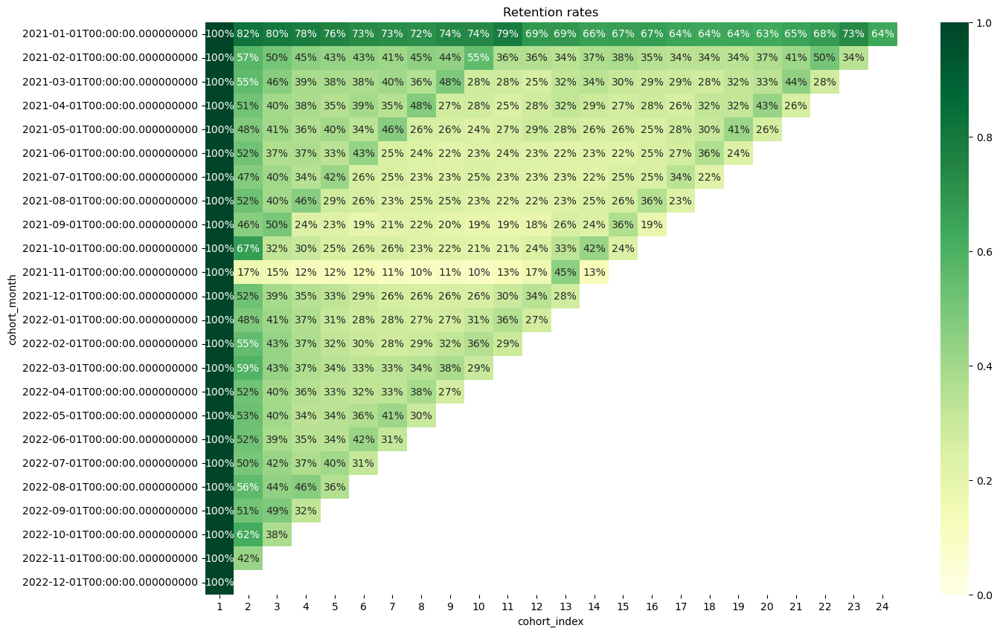

In [45]:
plt.figure(figsize=(15, 10))
plt.title('Retention rates')
sns.heatmap(data=retention,annot = True,fmt = '.0%',vmin = 0.0,vmax = 1,cmap="YlGn")
plt.show()

In [43]:
retention.to_excel("Retention_Rate.xlsx", index=True)

## SALE FORECAST

In [12]:
data = pd.read_csv('TAB_Betting_Data.csv')

In [14]:
data['DATE_DIM'] = pd.to_datetime(data['DATE_DIM'])

<Axes: >

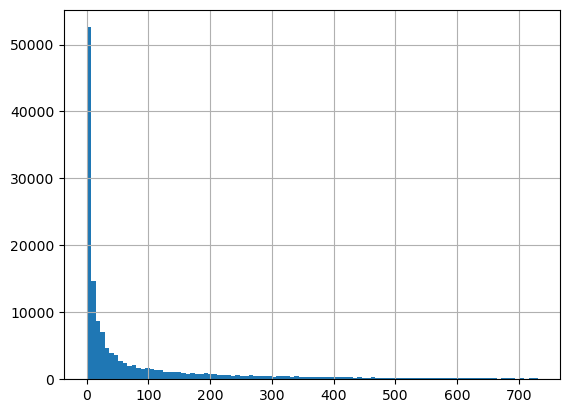

In [6]:
data.groupby('BET_ACCOUNT_NUM_HASH')['AGE'].agg('count').hist(bins = 100)

In [15]:
turnover_series = data.groupby('DATE_DIM')['TOTAL_TURNOVER'].sum().sort_index()

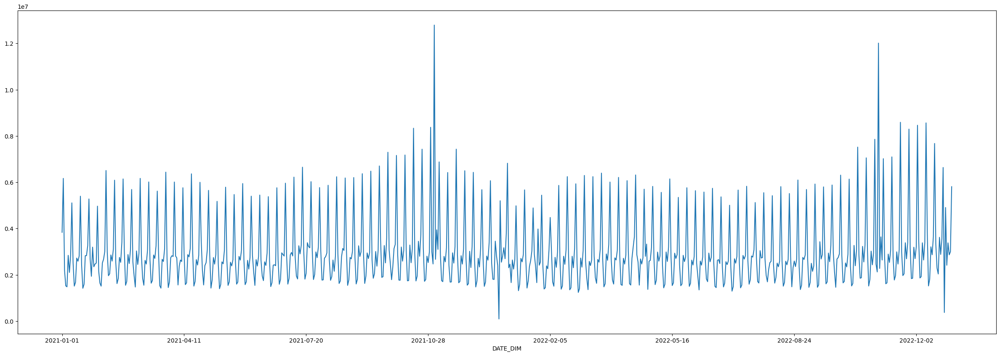

In [5]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (30, 10))
turnover_series.plot()
plt.show()

In [5]:
date_threshold = '2022-09-30'
turnover_train = turnover_series[turnover_series.index <= date_threshold]
turnover_test = turnover_series[turnover_series.index > date_threshold]

In [8]:
STATE_MAP = {
    'WA': 0,
    'OTH': 1,
}

GENDER_MAP = {
    'M': 0,
    'F': 1,
    'U': 2,
}

DAY_OF_WEEK_MAP = {
    'Mon': 0,
    'Tue': 1,
    'Wed': 2,
    'Thu': 3,
    'Fri': 4,
    'Sat': 5,
    'Sun': 6,
}

data['RESIDENTIAL_STATE'] = data.RESIDENTIAL_STATE.map(STATE_MAP)
data['GENDER'] = data.GENDER.map(GENDER_MAP)
data['DAY_OF_WEEK'] = data.DAY_OF_WEEK.map(DAY_OF_WEEK_MAP)

data['FURTURE_TOTAL_TURNOVER'] = data.groupby('BET_ACCOUNT_NUM_HASH')['TOTAL_TURNOVER'].shift(periods = -1)
data = data.loc[~data.FURTURE_TOTAL_TURNOVER.isna()]
data = data.loc[~data.AGE.isna()]
data

,DATE_DIM,DAY_OF_WEEK,BET_ACCOUNT_NUM_HASH,AGE,AGE_BAND,GENDER,TENURE_IN_DAYS,RESIDENTIAL_STATE,FOB_RACING_TURNOVER,FOB_SPORT_TURNOVER,PARI_RACING_TURNOVER,PARI_SPORT_TURNOVER,TOTAL_TURNOVER,DIVIDENDS_PAID,GROSS_MARGIN,TICKETS,FURTURE_TOTAL_TURNOVER
0,2021-01-01,4,13154,67.0,65+,0,11846,0,37.0,NaN,1081.0,NaN,1118.0,443.55,271.254275,288,27.5
1,2021-01-01,4,18379,54.0,45-54,0,1884,0,40.0,NaN,NaN,NaN,40.0,0.00,40.000000,1,90.0
2,2021-01-01,4,559232,63.0,55-64,0,2866,0,NaN,NaN,12.0,NaN,12.0,9.50,2.041720,5,148.0
3,2021-01-01,4,698904,69.0,65+,0,2100,0,NaN,NaN,1223.5,NaN,1223.5,267.91,245.117147,40,695.0
4,2021-01-01,4,762921,67.0,65+,0,4766,0,NaN,NaN,17.5,NaN,17.5,0.00,3.504075,5,426.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12337169,2022-12-30,4,4293358158,74.0,65+,1,2029,0,15.0,NaN,NaN,NaN,15.0,0.00,15.000000,1,30.0
12337170,2022-12-30,4,4293602952,46.0,45-54,0,3815,0,10.0,NaN,NaN,NaN,10.0,0.00,10.000000,1,464.5
12337171,2022-12-30,4,4293715592,61.0,55-64,1,6870,0,8.0,NaN,29.5,NaN,37.5,12.45,10.628614,15,81.0
12337172,2022-12-30,4,4294296954,30.0,25-34,2,13,1,NaN,NaN,100.0,NaN,100.0,0.00,14.741093,2,450.0


In [9]:
USECOLS = ['DAY_OF_WEEK', 'AGE', 'GENDER', 'TENURE_IN_DAYS', 'RESIDENTIAL_STATE', 'TOTAL_TURNOVER','DIVIDENDS_PAID']
TARGET_COL = 'FURTURE_TOTAL_TURNOVER'
data['DATE_DIM'] = pd.to_datetime(data['DATE_DIM'], format = '%Y-%m-%d')
data = data.set_index(['BET_ACCOUNT_NUM_HASH', 'DATE_DIM'])

In [10]:
!pip install linearmodels

     ---------------------------------------- 1.7/1.7 MB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 94.2/94.2 kB 1.8 MB/s eta 0:00:00
     ---------------------------------------- 42.1/42.1 kB 1.0 MB/s eta 0:00:00
     ---------------------------------------- 2.8/2.8 MB 6.6 MB/s eta 0:00:00


In [10]:
from linearmodels.panel.model import PanelOLS

X = data[USECOLS]
X['intercept'] = 1

y = data[TARGET_COL]

In [11]:
model = PanelOLS(
    dependent = y,
    exog = X
)
res = model.fit(
    cov_type = 'clustered'
)

res.summary

Dep. Variable:,FURTURE_TOTAL_TURNOVER,R-squared:,0.2841
Estimator:,PanelOLS,R-squared (Between):,0.6278
No. Observations:,12216566,R-squared (Within):,0.0723
Date:,"Fri, Mar 29 2024",R-squared (Overall):,0.2841
Time:,23:50:30,Log-likelihood,-9.427e+07
Cov. Estimator:,Clustered,,
,,F-statistic:,6.926e+05
Entities:,125802,P-value,0.0000
Avg Obs:,97.109,Distribution:,"F(7,12216558)"
Min Obs:,1.0000,,
Max Obs:,729.00,F-statistic (robust):,1.748e+04


### Model diagnosis

the SARIMAX model has this form SARIMAX(p,d,q)(P,D,Q)m
in which,
* p, d, q are the AR order, the difference order, and the MA order, correspondingly, of the non-seasonal part.
* P, D, Q are AR order, the difference order, and the MA order, correspondingly, of the seasonal part.
* m is the seasonal order

Split the data into 2 parts, for (i) training and (ii) testing

In [16]:
date_threshold = '2022-09-30'
turnover_train = turnover_series[turnover_series.index <= date_threshold]
turnover_test = turnover_series[turnover_series.index > date_threshold]

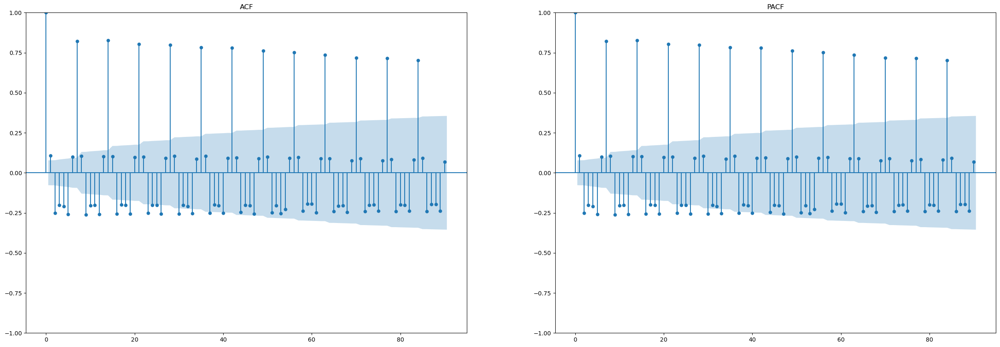

In [17]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
warnings.filterwarnings('ignore')

fig, ax = plt.subplots(1, 2, figsize = (30, 10))
plot_acf(turnover_train, ax = ax[0], lags = 90)
ax[0].set_title('ACF')   # Autocorrelation function
plot_acf(turnover_train, ax = ax[1], lags = 90)
ax[1].set_title('PACF')    # Partial Autocorrelation function
plt.show()

* Clearly, the data shows autocorrelation at every 7 lag --> it makes sense given this has the daily frequency and the betting pattern repeats every week.
* For the SARIMA model, then we know that the seasonal order should be model at lag 7.
* For the non-seasonal part, lags 2 to 5 are negatively correlated with lag 0, while we don't observe significant correlations at lags 1 and 6 --> this suggests the MA part of the should have the order of 5. In addition, we don't see any decaying pattern in the non-seasonal part, the AR part should be 0.
* The series seems stationary, so no difference is needed --> d = 0.

Let's try SARIMAX(0, 0, 5)(0, 1, 1)7


In [18]:
import statsmodels.api as sm

parameters = [
    [(1, 0, 1), (1, 0, 1, 7)],
    # [(2, 0, 1), (0, 0, 2, 7)],
    # [(3, 0, 2), (0, 0, 1, 7)],
    # [(4, 0, 2), (0, 0, 1, 7)]
]

for order, seasonal_order in parameters:
    print(order, seasonal_order)
    model = sm.tsa.SARIMAX(turnover_train, order = order, seasonal_order = seasonal_order)
    res = model.fit()
    print(res.summary())

(1, 0, 1) (1, 0, 1, 7)
                                     SARIMAX Results                                     
Dep. Variable:                    TOTAL_TURNOVER   No. Observations:                  638
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 7)   Log Likelihood               -9805.095
Date:                           Mon, 01 Apr 2024   AIC                          19620.189
Time:                                   13:46:07   BIC                          19642.481
Sample:                               01-01-2021   HQIC                         19628.843
                                    - 09-30-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9850      0.042     23.641      0.000       0.903       1.067
ma.L1         -0.934

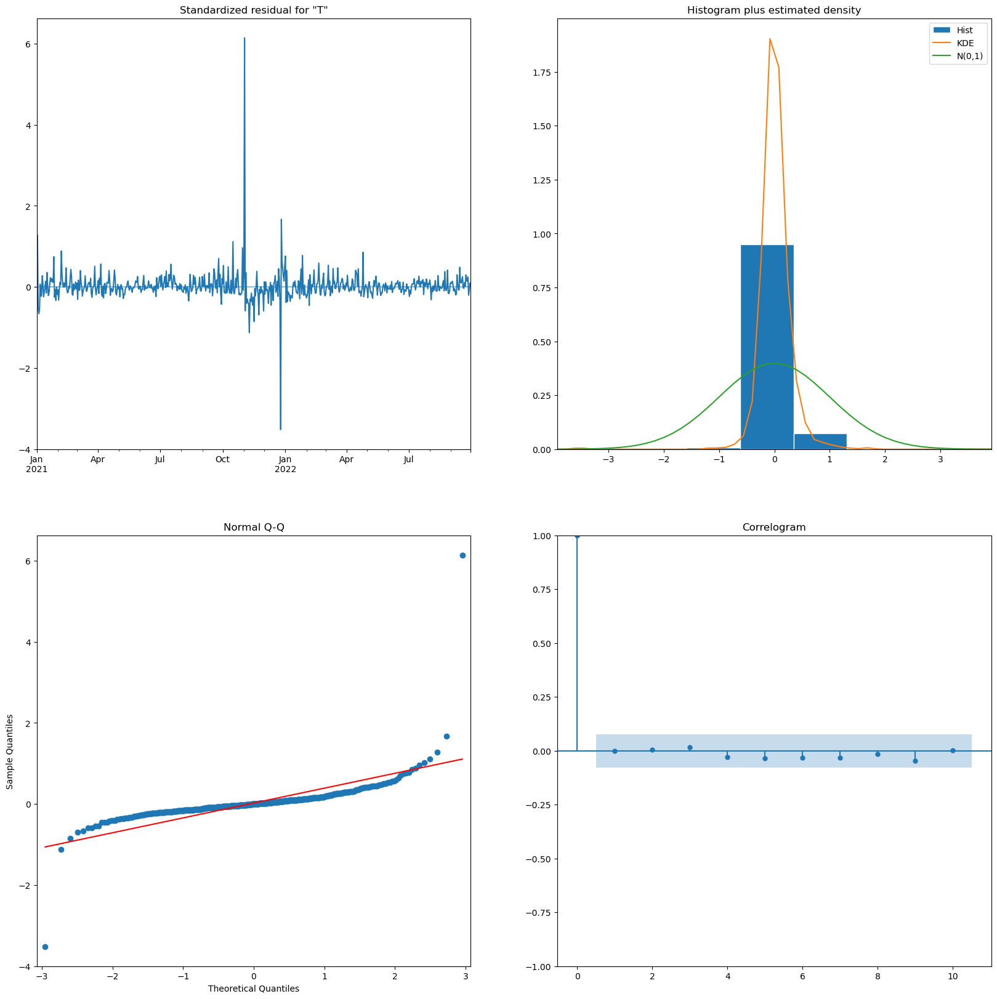

In [19]:
res.plot_diagnostics(figsize = (20, 20))
plt.show()

Use model to forecast

In [20]:
from tqdm.notebook import tqdm

point_predictions = []

for i in tqdm(range(len(turnover_test))):
    # Re-train the model with newly comming data
    new_data = pd.concat([turnover_train, turnover_test[:i]])
    order = (1, 0, 1)
    seasonal_order = (1, 0, 1, 7)
    model = sm.tsa.SARIMAX(new_data, order = order, seasonal_order = seasonal_order)
    result = model.fit()
    point_predictions.append(result.forecast())

pred = pd.concat(point_predictions)

  0%|          | 0/92 [00:00<?, ?it/s]

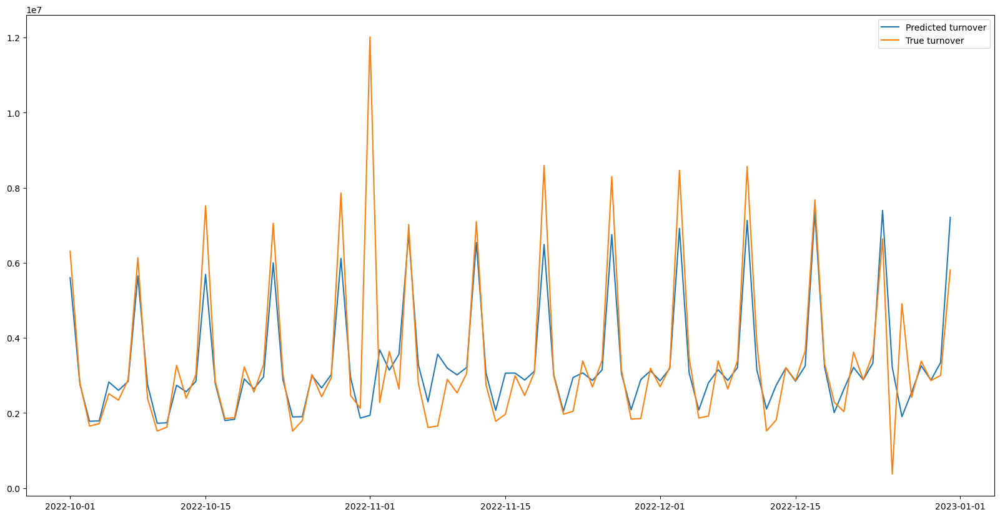

In [21]:
fig = plt.figure(figsize = (20, 10))
plt.plot(pred, label = 'Predicted turnover')
plt.plot(turnover_test, label = 'True turnover')
plt.legend()
plt.show()

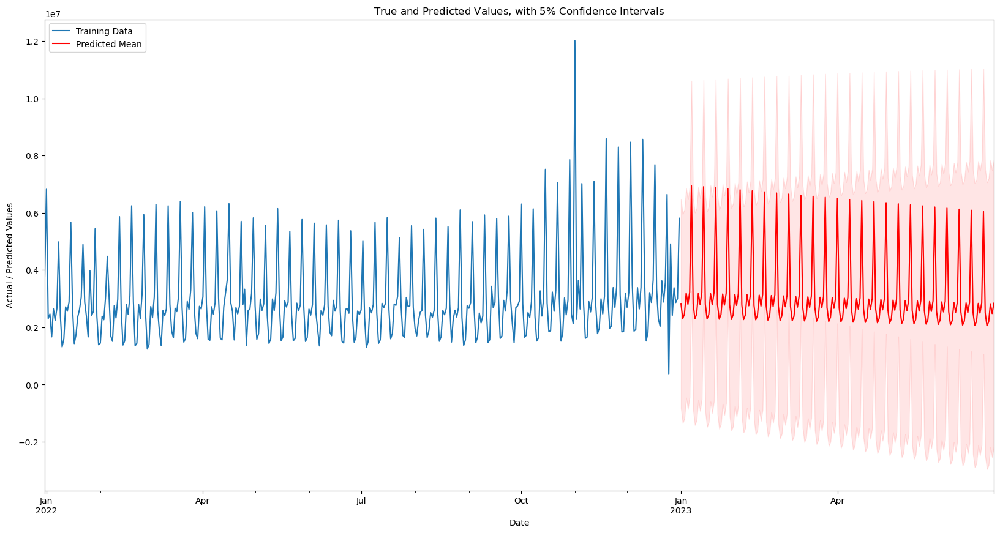

In [25]:
# Train the model
order = (1, 0, 1)
seasonal_order = (1, 0, 1, 7)
model = sm.tsa.SARIMAX(turnover_series, order = order, seasonal_order = seasonal_order)
res = model.fit()

# Predict
preds_df = res.get_prediction(start = '2023-01-01', end = '2023-06-30').summary_frame(alpha = 0.05)

# Visualize
fig, ax = plt.subplots(figsize = (20, 10))
ax = turnover_series[turnover_series.index >= '2021-12-31'].plot(label = 'Training Data')
ax.set(
    title = 'True and Predicted Values, with 5$\%$ Confidence Intervals',
    xlabel = 'Date',
    ylabel = 'Actual / Predicted Values'
)
preds_df['mean'].plot(ax = ax, style = 'r', label = 'Predicted Mean')
ax.fill_between(
    preds_df.index,
    preds_df['mean_ci_lower'],
    preds_df['mean_ci_upper'],
    color = 'r',
    alpha = 0.1
)

legend = ax.legend(loc = 'upper left')
plt.show()

## EDA

In [4]:
df.head()

,DATE_DIM,DAY_OF_WEEK,BET_ACCOUNT_NUM_HASH,AGE,AGE_BAND,GENDER,TENURE_IN_DAYS,RESIDENTIAL_STATE,FOB_RACING_TURNOVER,FOB_SPORT_TURNOVER,PARI_RACING_TURNOVER,PARI_SPORT_TURNOVER,TOTAL_TURNOVER,DIVIDENDS_PAID,GROSS_MARGIN,TICKETS
0,2021-01-01,Fri,13154,67.0,65+,M,11846,WA,37.0,NaN,1081.0,NaN,1118.0,443.55,271.254275,288
1,2021-01-01,Fri,18379,54.0,45-54,M,1884,WA,40.0,NaN,NaN,NaN,40.0,0.00,40.000000,1
2,2021-01-01,Fri,559232,63.0,55-64,M,2866,WA,NaN,NaN,12.0,NaN,12.0,9.50,2.041720,5
3,2021-01-01,Fri,698904,69.0,65+,M,2100,WA,NaN,NaN,1223.5,NaN,1223.5,267.91,245.117147,40
4,2021-01-01,Fri,762921,67.0,65+,M,4766,WA,NaN,NaN,17.5,NaN,17.5,0.00,3.504075,5


In [19]:
df['DATE_DIM'] = pd.to_datetime(df['DATE_DIM'])
df['Year'] = df['DATE_DIM'].dt.year
df['Month'] = df['DATE_DIM'].dt.month
Turnover_month = df.groupby(['Year', 'Month']).agg({'FOB_RACING_TURNOVER': 'sum', 
                                                    'PARI_RACING_TURNOVER': 'sum', 
                                                    'FOB_SPORT_TURNOVER': 'sum', 
                                                    'PARI_SPORT_TURNOVER': 'sum', 
                                                    'TOTAL_TURNOVER': 'sum', 
                                                    'DIVIDENDS_PAID': 'sum', 
                                                    'GROSS_MARGIN': 'sum', 'BET_ACCOUNT_NUM_HASH': 'nunique'}).reset_index()

In [28]:
Active_customer = df.groupby(['Year']).agg({'BET_ACCOUNT_NUM_HASH': 'nunique'}).reset_index()

In [29]:
Active_customer

,Year,BET_ACCOUNT_NUM_HASH
0,2021,110526
1,2022,116488


In [32]:
Total_customer = df.groupby(['Year']).agg({'BET_ACCOUNT_NUM_HASH': 'unique'}).reset_index()

In [40]:
df_2021 = df[df['DATE_DIM'].dt.year == 2021]
df_2021['BET_ACCOUNT_NUM_HASH'].nunique()

110526

In [18]:
Turnover_month.to_excel("Turnover_month.xlsx", index=True)

In [ ]:
sns.jointplot(x='GROSS_MARGIN',y='DIVIDENDS_PAID',data=df,kind='scatter')